## 1. Before You Begin

MAI-Image-2.5-Flash is the production-efficiency variant of the MAI-Image-2.5 family.
It delivers text-to-image generation at lower latency and cost per image, making it the
right choice when throughput and cost matter more than maximum fidelity.

**Use Flash when:**
- Generating large volumes of images (e-commerce, marketing asset pipelines)
- Latency per image is more important than portrait or text-rendering precision
- Running concurrent batch jobs under a cost budget

**Prerequisites**

1. A Microsoft Foundry project with MAI-Image-2.5-Flash deployed.
   See [models/quickstart/](../../../../quickstart/README.md) for first-time setup.
2. The three environment variables listed in section 2.
3. `requests` installed: `pip install requests`

**API constraints** ([source: Learn docs](https://learn.microsoft.com/en-us/azure/foundry/foundry-models/how-to/use-foundry-models-mai-image?tabs=python))

| Rule | Value |
|---|---|
| Minimum dimension (each) | 768 px |
| Maximum total pixels | 1,048,576 |
| Output format | PNG only |
| Auth header | `api-key` |


## 2. Set up your environment

The cell below verifies the three required variables and derives `BASE_ENDPOINT`.
It also imports `time` and `concurrent.futures`, used in later sections for
throughput measurement and concurrent requests.


In [1]:
%pip install requests python-dotenv --quiet

Note: you may need to restart the kernel to use updated packages.


In [2]:
from dotenv import load_dotenv
load_dotenv()

True

In [3]:
import os, base64, time
import requests
import concurrent.futures
from pathlib import Path
from urllib.parse import urlparse
from IPython.display import Image as IPyImage, display

REQUIRED = {
    "MICROSOFT_FOUNDRY_ENDPOINT":             "Foundry project endpoint",
    "MICROSOFT_FOUNDRY_API_KEY":               "AIServices API key",
    "AZURE_MAI_IMAGE_25_FLASH_DEPLOYMENT":     "MAI-Image-2.5-Flash deployment name",
}
missing = [k for k in REQUIRED if not os.environ.get(k)]
if missing:
    raise EnvironmentError(f"Set these env vars before continuing: {missing}")

parsed        = urlparse(os.environ["MICROSOFT_FOUNDRY_ENDPOINT"])
BASE_ENDPOINT = f"{parsed.scheme}://{parsed.netloc}"
API_KEY       = os.environ["MICROSOFT_FOUNDRY_API_KEY"]
DEPLOYMENT    = os.environ["AZURE_MAI_IMAGE_25_FLASH_DEPLOYMENT"]

print(f"Base endpoint : {BASE_ENDPOINT}")
print(f"Deployment    : {DEPLOYMENT}")
print("Environment check passed.")


Base endpoint : https://model-releases-proj-resource.services.ai.azure.com
Deployment    : MAI-Image-2.5-Flash
Environment check passed.


## 3. Configure the client

Flash uses the same `/mai/v1/images/generations` endpoint as the base model.
This notebook focuses on generation only (no edits) to keep the throughput
measurements comparable.


In [4]:
GEN_URL = f"{BASE_ENDPOINT}/mai/v1/images/generations"

OUT_DIR = Path("output")
OUT_DIR.mkdir(exist_ok=True)


def generate_image(prompt: str, width: int = 1024, height: int = 1024) -> str:
    """POST to /mai/v1/images/generations; return base64 PNG string."""
    assert width >= 768 and height >= 768, "Each dimension must be ≥ 768 px"
    assert width * height <= 1_048_576,    "width × height must be ≤ 1,048,576"
    resp = requests.post(
        GEN_URL,
        headers={"Content-Type": "application/json", "api-key": API_KEY},
        json={"model": DEPLOYMENT, "prompt": prompt, "width": width, "height": height},
        timeout=120,
    )
    resp.raise_for_status()
    return resp.json()["data"][0]["b64_json"]


def show(b64: str, save_as: str | None = None) -> None:
    """Decode base64 PNG, optionally save, and display inline."""
    raw = base64.b64decode(b64)
    if save_as:
        out = OUT_DIR / save_as
        out.write_bytes(raw)
        print(f"Saved → {out}")
    display(IPyImage(data=raw))


## 4. Generate a batch of images

A batch is a list of prompts processed sequentially.
This establishes a baseline before parallelising in section 6.

The prompts below represent a product photography pipeline:
eight product variants, one image each.


Saved → output/batch-seq-00.png


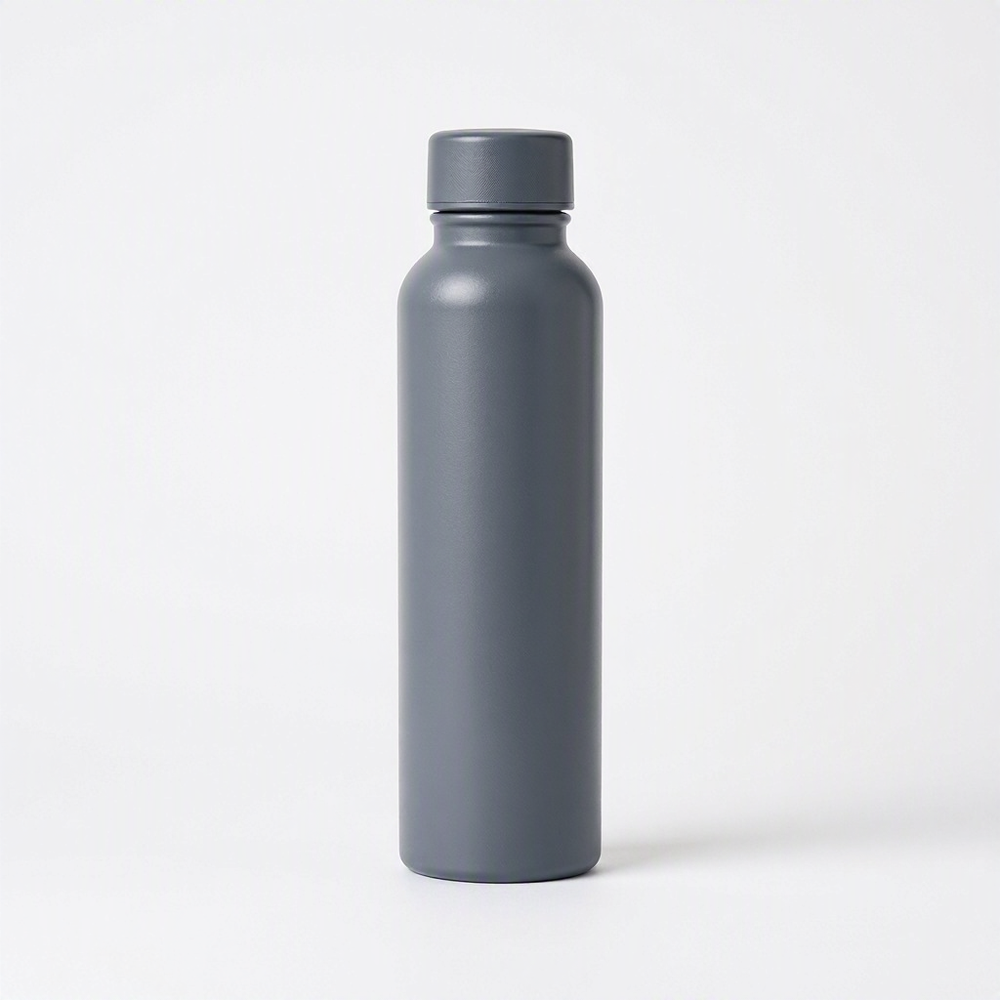

Saved → output/batch-seq-01.png


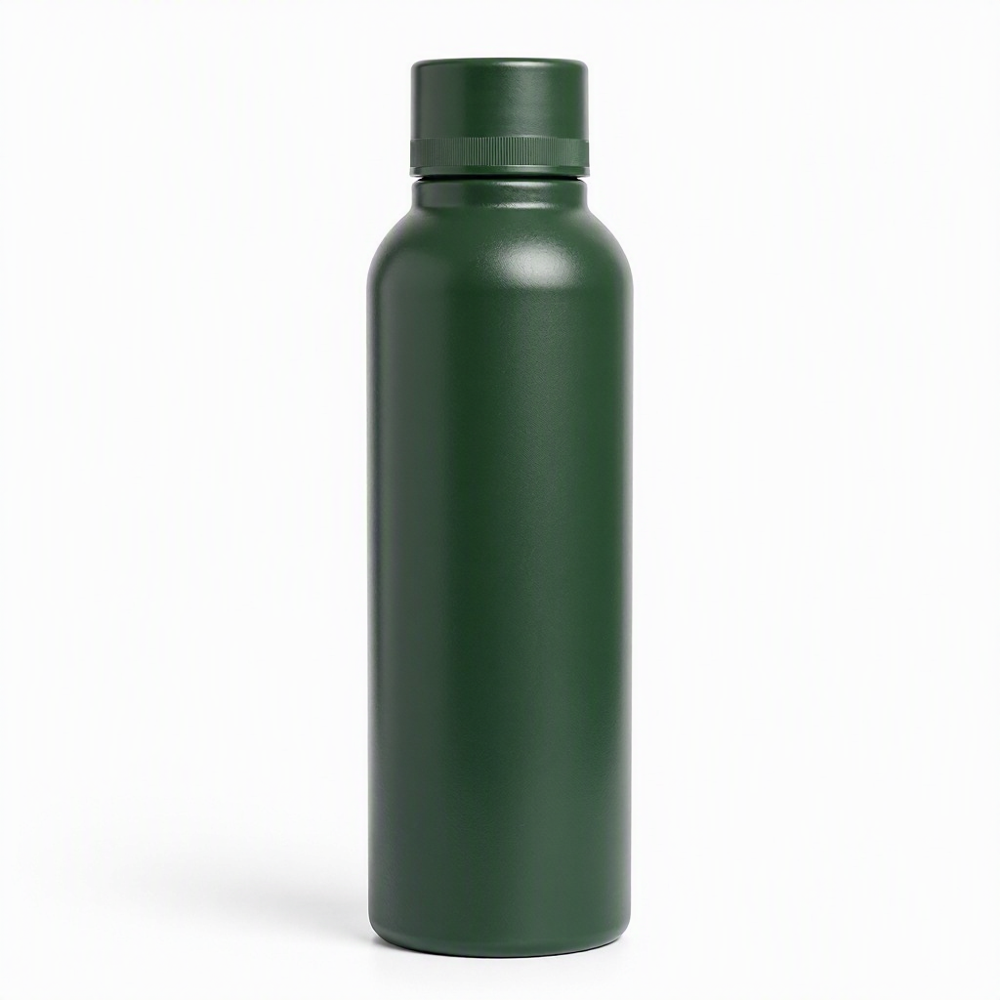

Saved → output/batch-seq-02.png


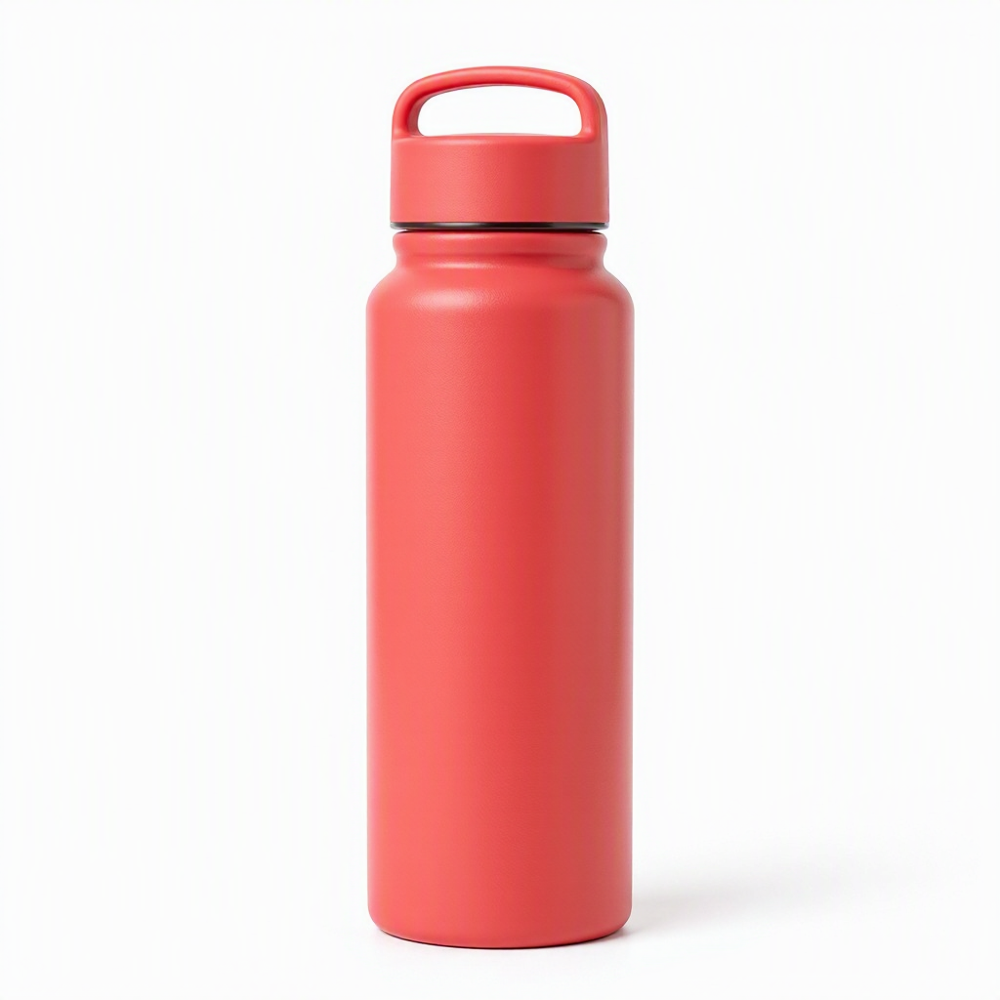

Saved → output/batch-seq-03.png


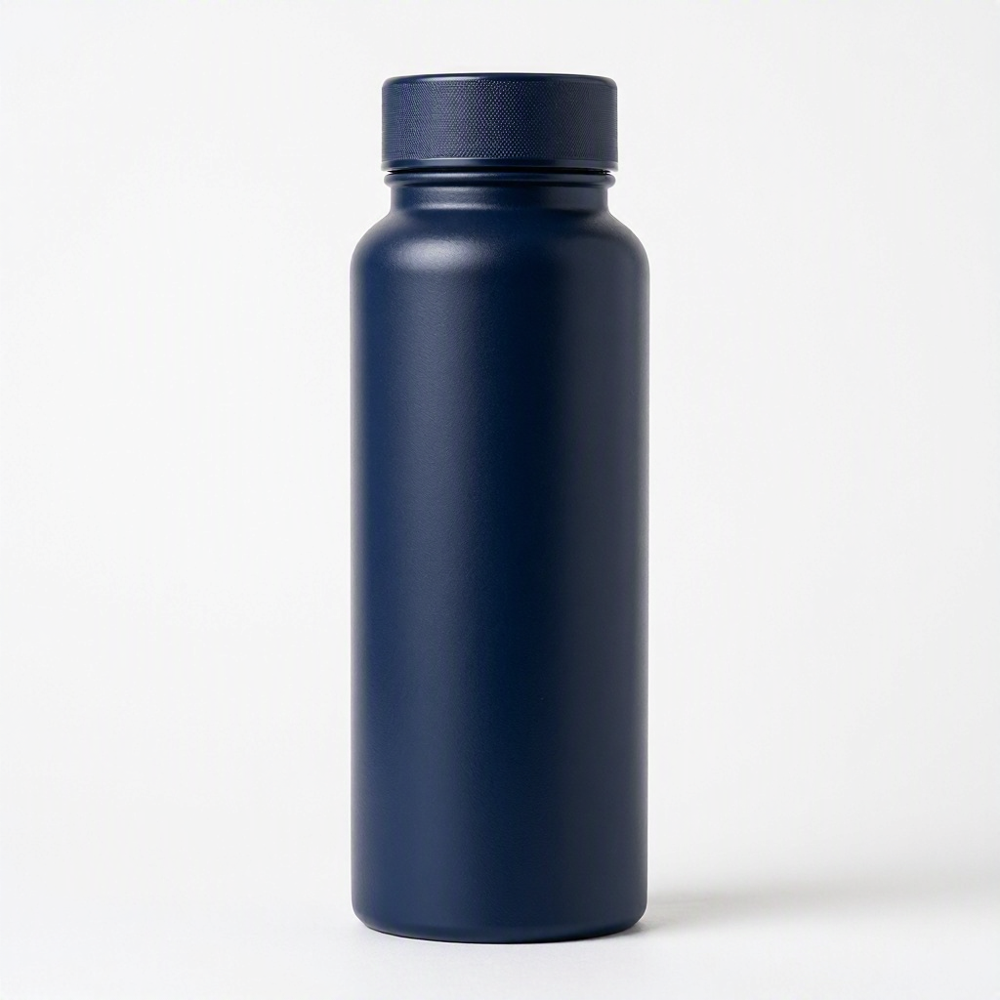

Saved → output/batch-seq-04.png


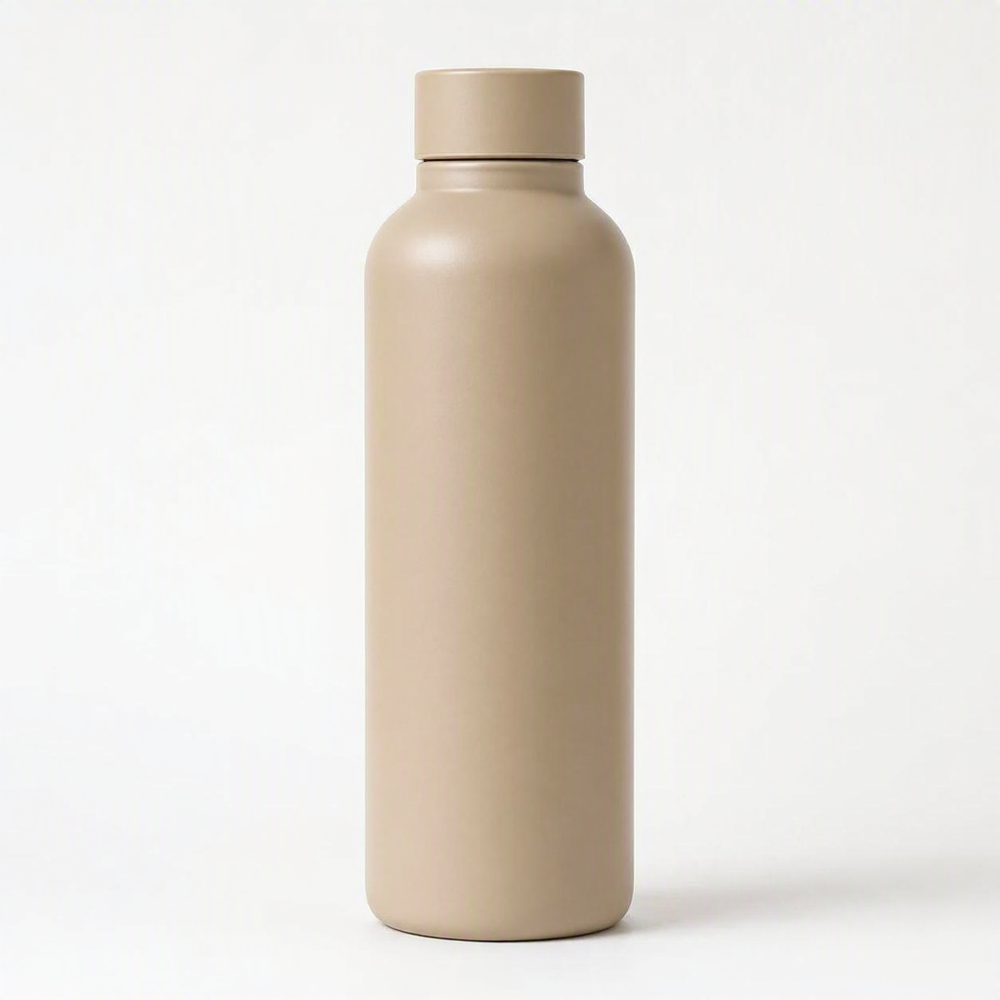

Saved → output/batch-seq-05.png


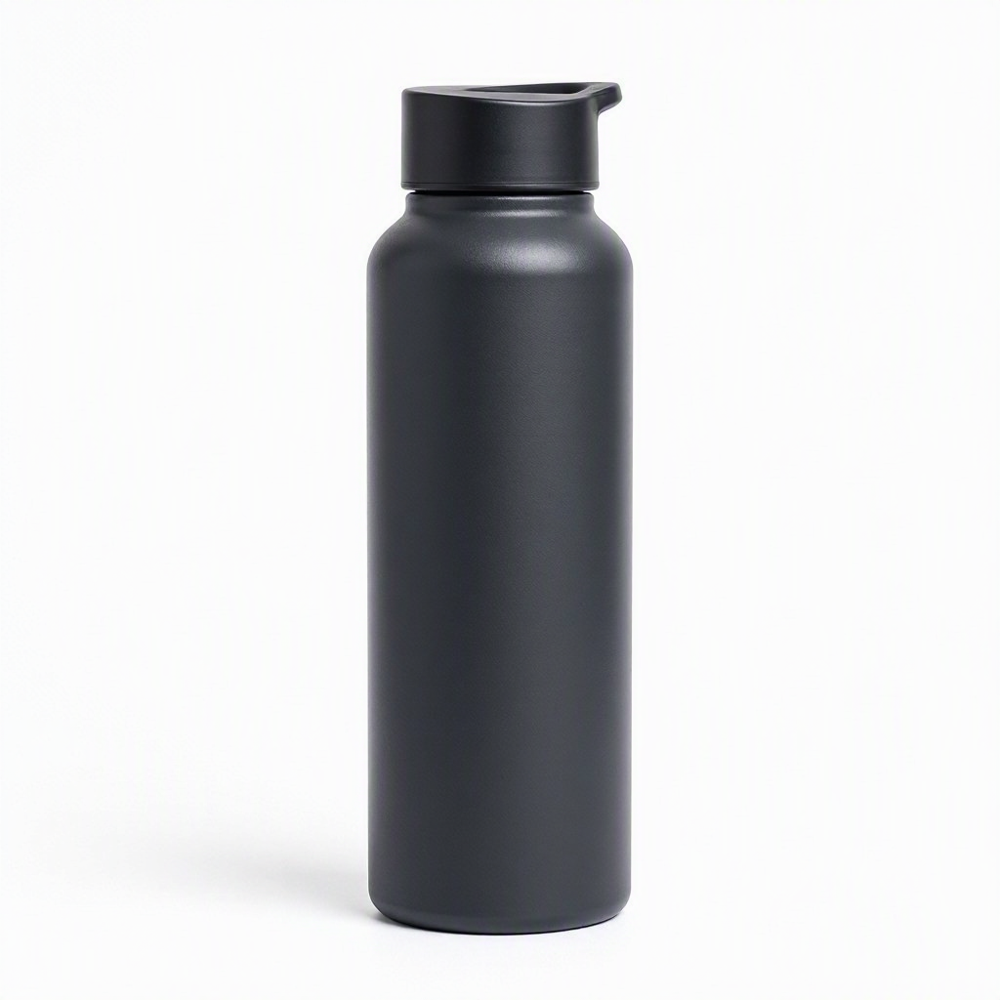

Saved → output/batch-seq-06.png


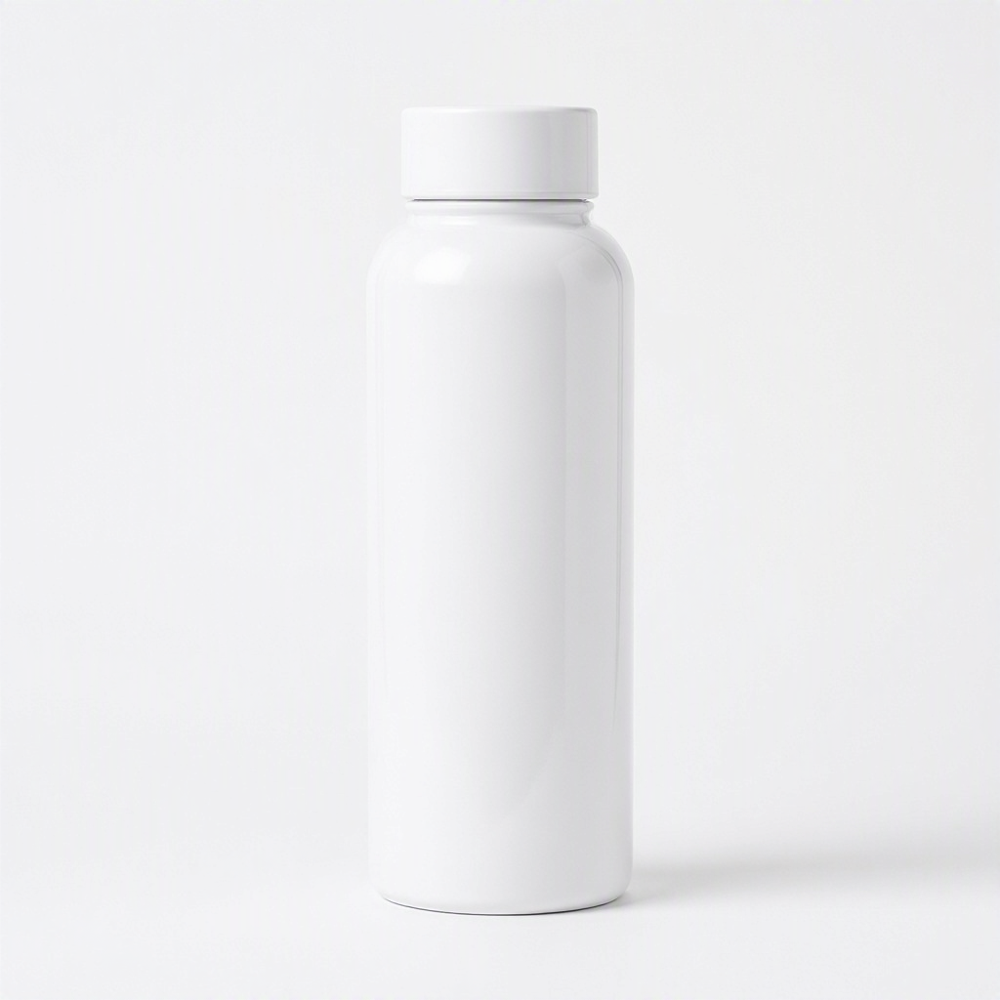

Saved → output/batch-seq-07.png


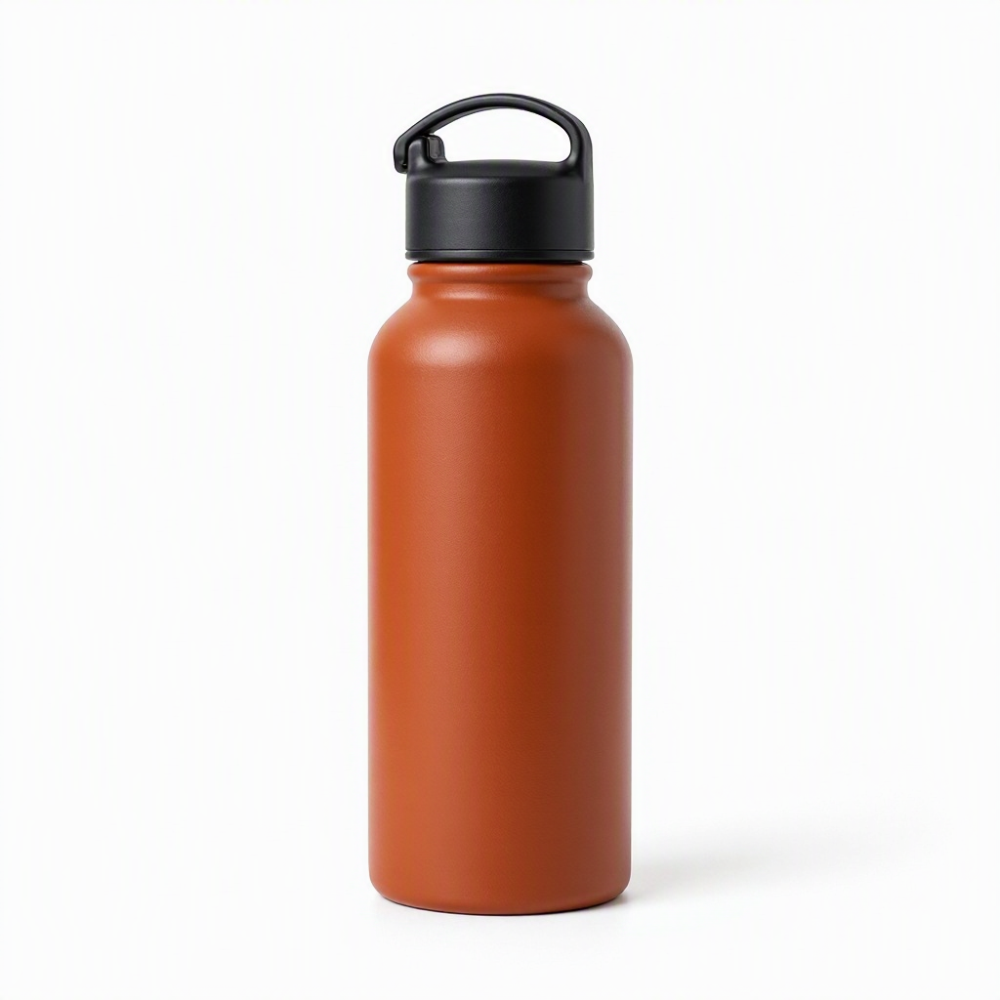


Sequential batch: 8 images in 87.8s (11.0s / image)


In [5]:
PRODUCT_PROMPTS = [
    "Studio shot of a slate-grey water bottle on white background, soft-box lighting",
    "Studio shot of a forest-green water bottle on white background, soft-box lighting",
    "Studio shot of a coral-red water bottle on white background, soft-box lighting",
    "Studio shot of a midnight-blue water bottle on white background, soft-box lighting",
    "Studio shot of a sand-beige water bottle on white background, soft-box lighting",
    "Studio shot of a charcoal-black water bottle on white background, soft-box lighting",
    "Studio shot of a cloud-white water bottle on white background, soft-box lighting",
    "Studio shot of a burnt-orange water bottle on white background, soft-box lighting",
]

results_sequential = []
t_start = time.monotonic()

for i, prompt in enumerate(PRODUCT_PROMPTS):
    b64 = generate_image(prompt, width=1024, height=1024)
    results_sequential.append(b64)
    show(b64, save_as=f"batch-seq-{i:02d}.png")

elapsed = time.monotonic() - t_start
print(f"\nSequential batch: {len(PRODUCT_PROMPTS)} images in {elapsed:.1f}s "
      f"({elapsed/len(PRODUCT_PROMPTS):.1f}s / image)")


## 5. Measure throughput and estimate cost

Before parallelising, record the single-request latency distribution.
This gives a baseline to compare against the concurrent run in section 6.

The cell below generates one image per prompt and records wall-clock time per call.
At current Flash pricing, estimate cost as `n_images × price_per_image`.


In [6]:
PRICE_PER_IMAGE = 0.04   # update if pricing changes — check model page for current rate

latencies = []
sample_prompts = PRODUCT_PROMPTS[:4]   # 4 samples for a faster measurement

for prompt in sample_prompts:
    t0 = time.monotonic()
    b64 = generate_image(prompt, width=1024, height=1024)
    latencies.append(time.monotonic() - t0)

avg_latency = sum(latencies) / len(latencies)
print(f"Samples        : {len(latencies)}")
print(f"Avg latency    : {avg_latency:.2f}s / image")
print(f"Min / Max      : {min(latencies):.2f}s / {max(latencies):.2f}s")
print()

for n in (10, 100, 1_000, 10_000):
    est_cost  = n * PRICE_PER_IMAGE
    est_time  = n * avg_latency
    print(f"  {n:>6} images → ${est_cost:>8.2f}  |  sequential ETA ≈ {est_time/60:,.1f} min")


Samples        : 4
Avg latency    : 11.10s / image
Min / Max      : 9.86s / 12.95s

      10 images → $    0.40  |  sequential ETA ≈ 1.8 min
     100 images → $    4.00  |  sequential ETA ≈ 18.5 min
    1000 images → $   40.00  |  sequential ETA ≈ 185.0 min
   10000 images → $  400.00  |  sequential ETA ≈ 1,849.7 min


## 6. Run concurrent requests

`concurrent.futures.ThreadPoolExecutor` issues requests in parallel.
Each worker is a blocking HTTP call, so threads (not processes) work here.

**Choose `max_workers` carefully:**
- Start with 4–8 workers to avoid rate-limit errors
- Check your Foundry quota page for the TPM / RPM limits on your deployment
- Increase gradually and re-run this cell to find your practical ceiling


Saved → output/batch-par-00.png


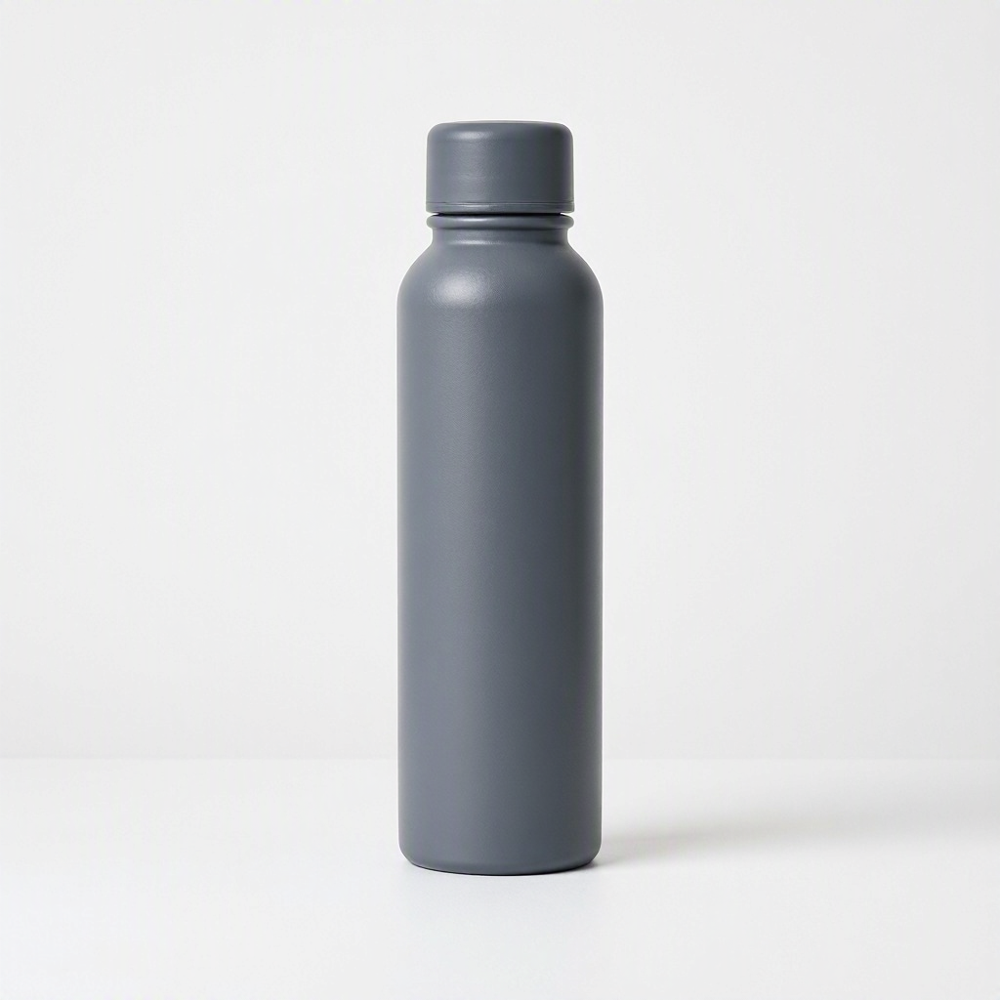

Saved → output/batch-par-01.png


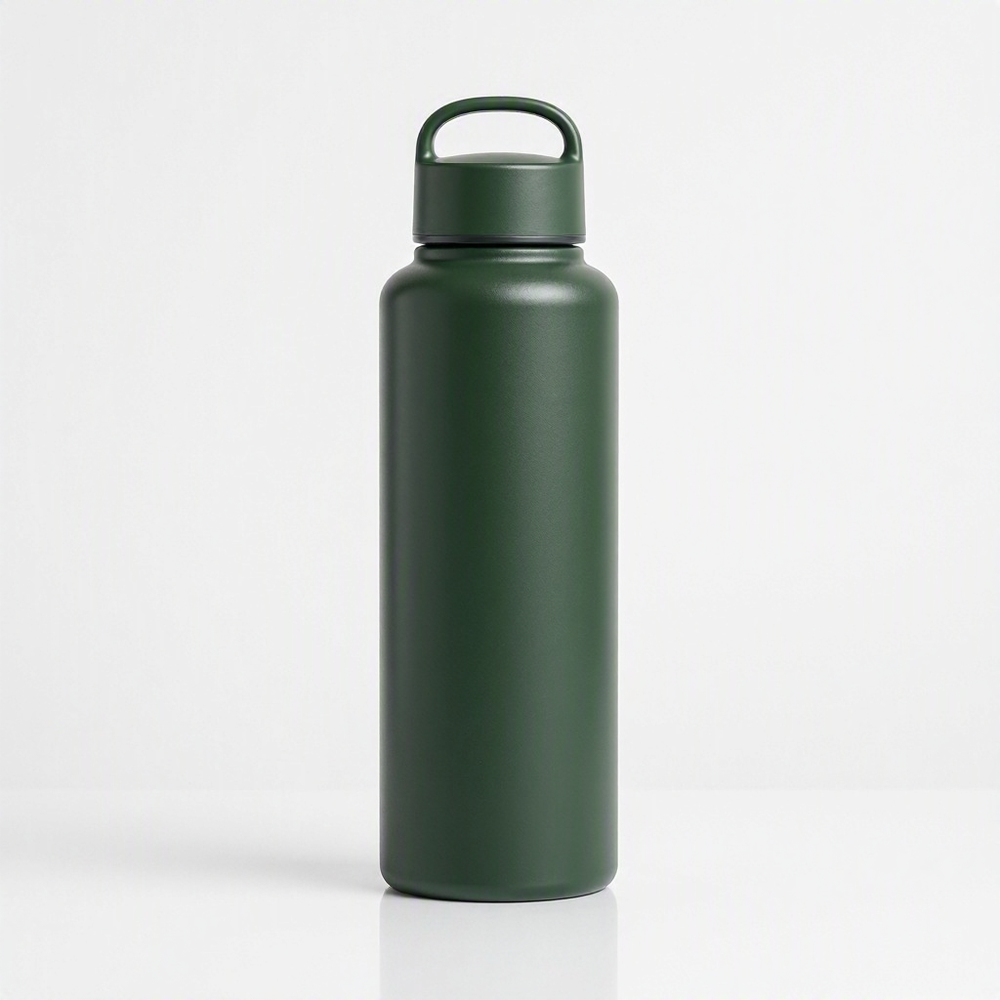

Saved → output/batch-par-02.png


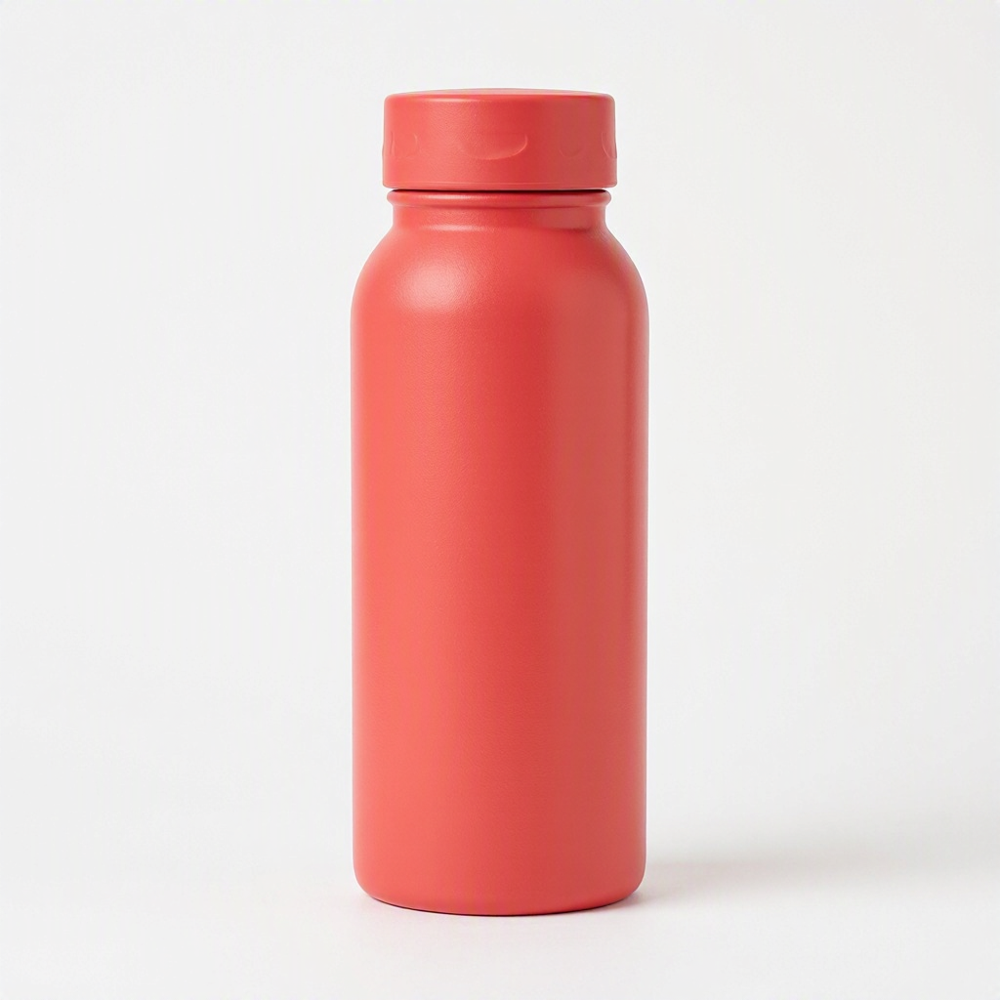

Saved → output/batch-par-03.png


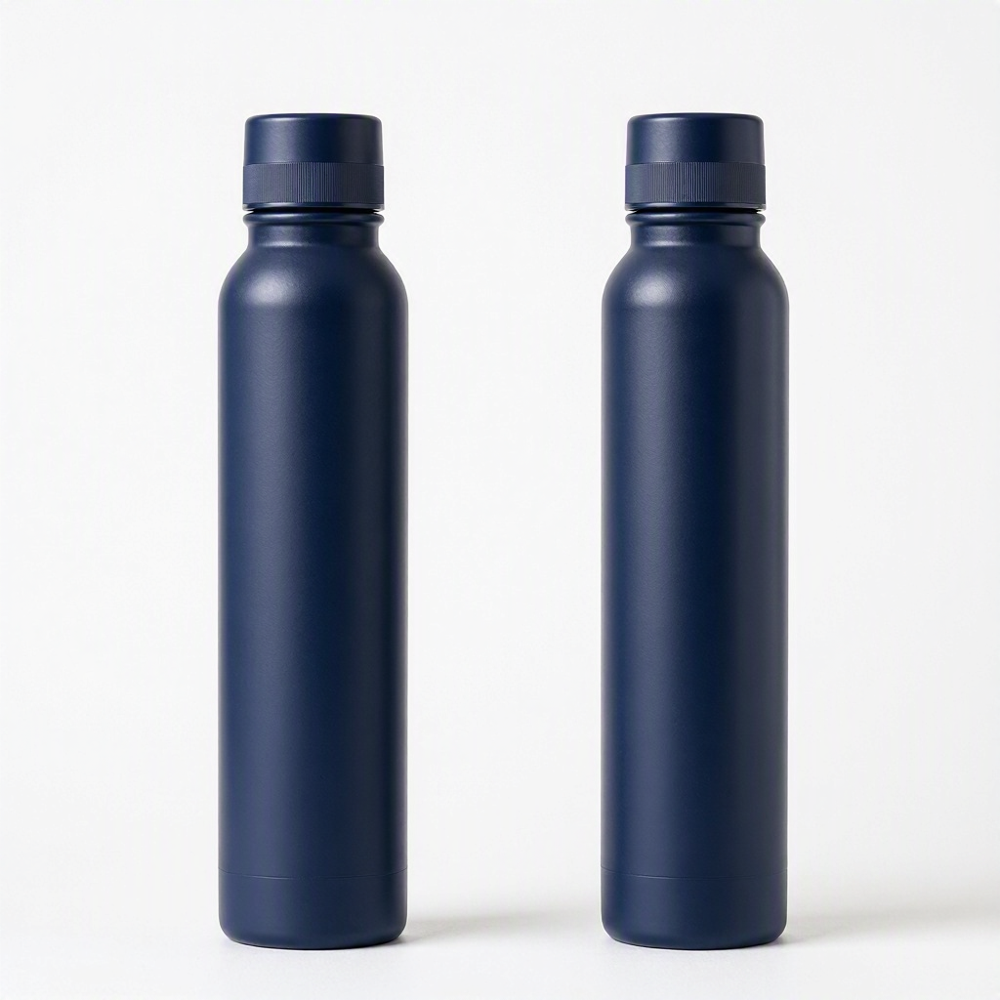

Saved → output/batch-par-04.png


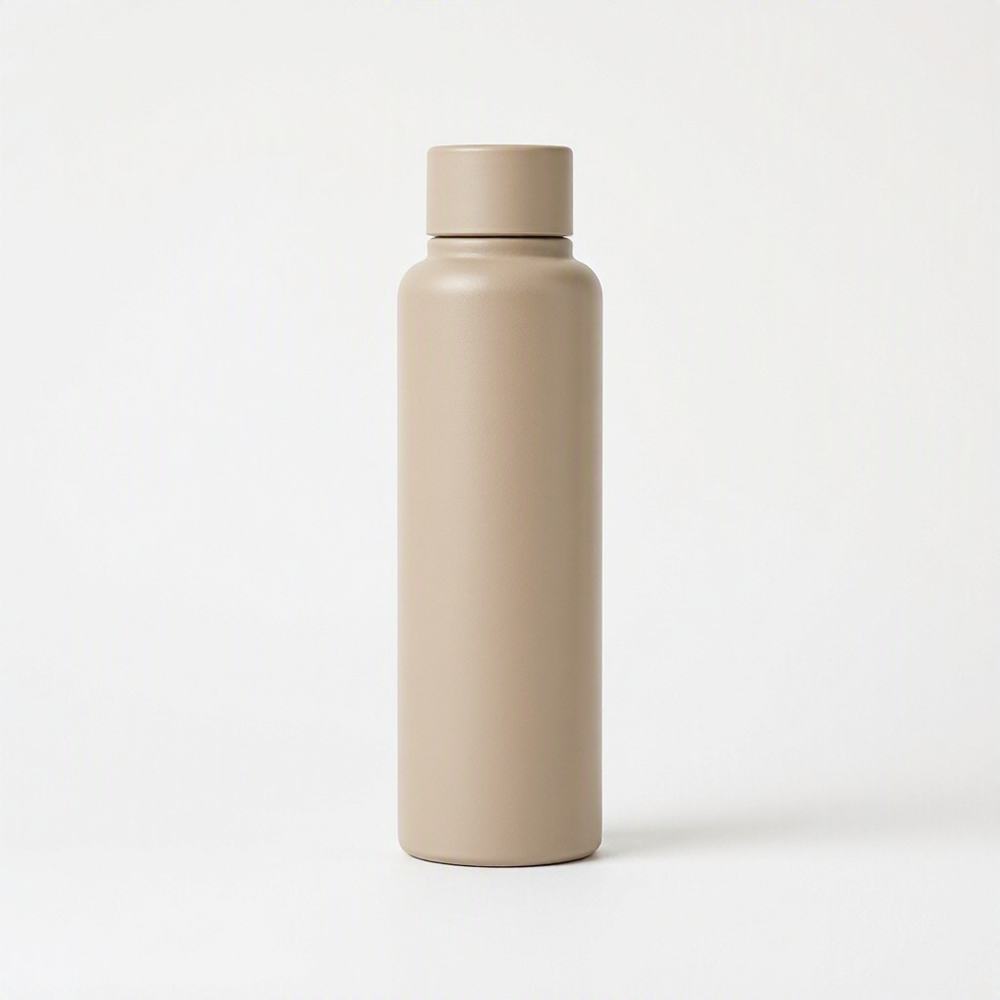

Saved → output/batch-par-05.png


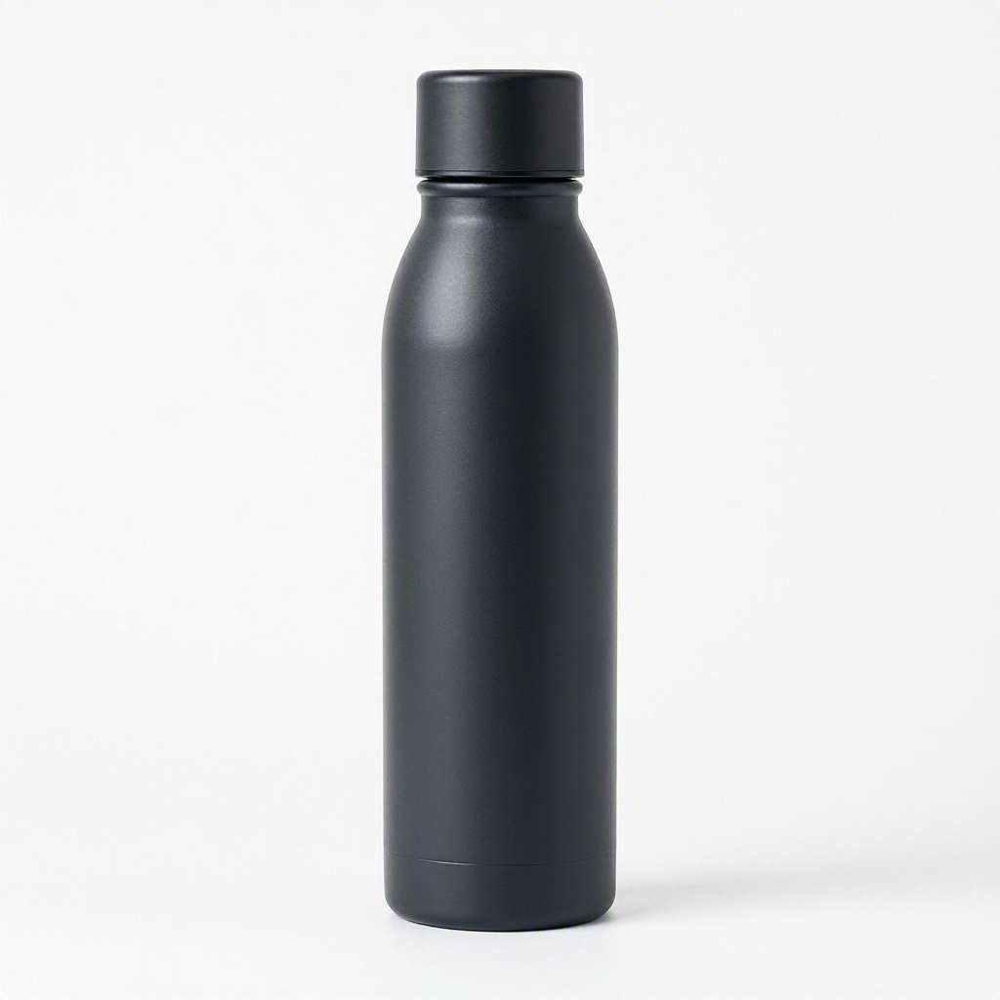

Saved → output/batch-par-06.png


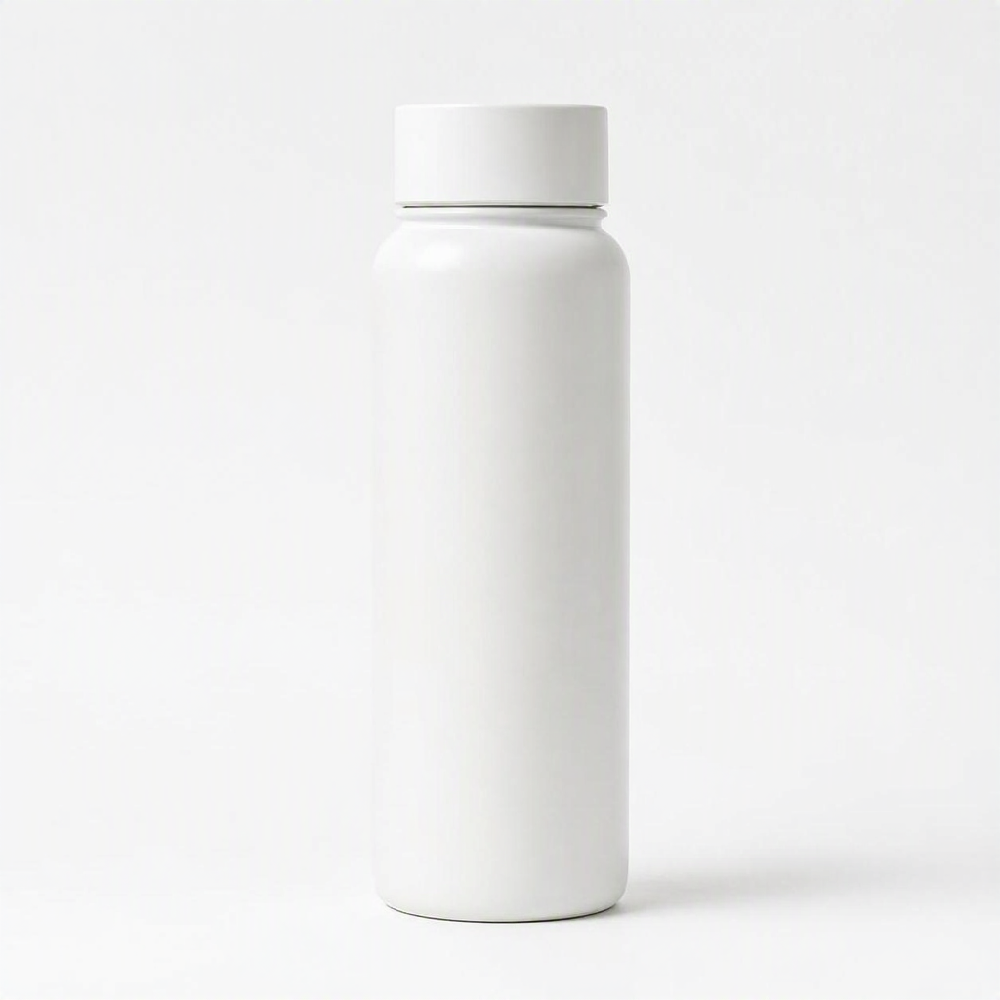

Saved → output/batch-par-07.png


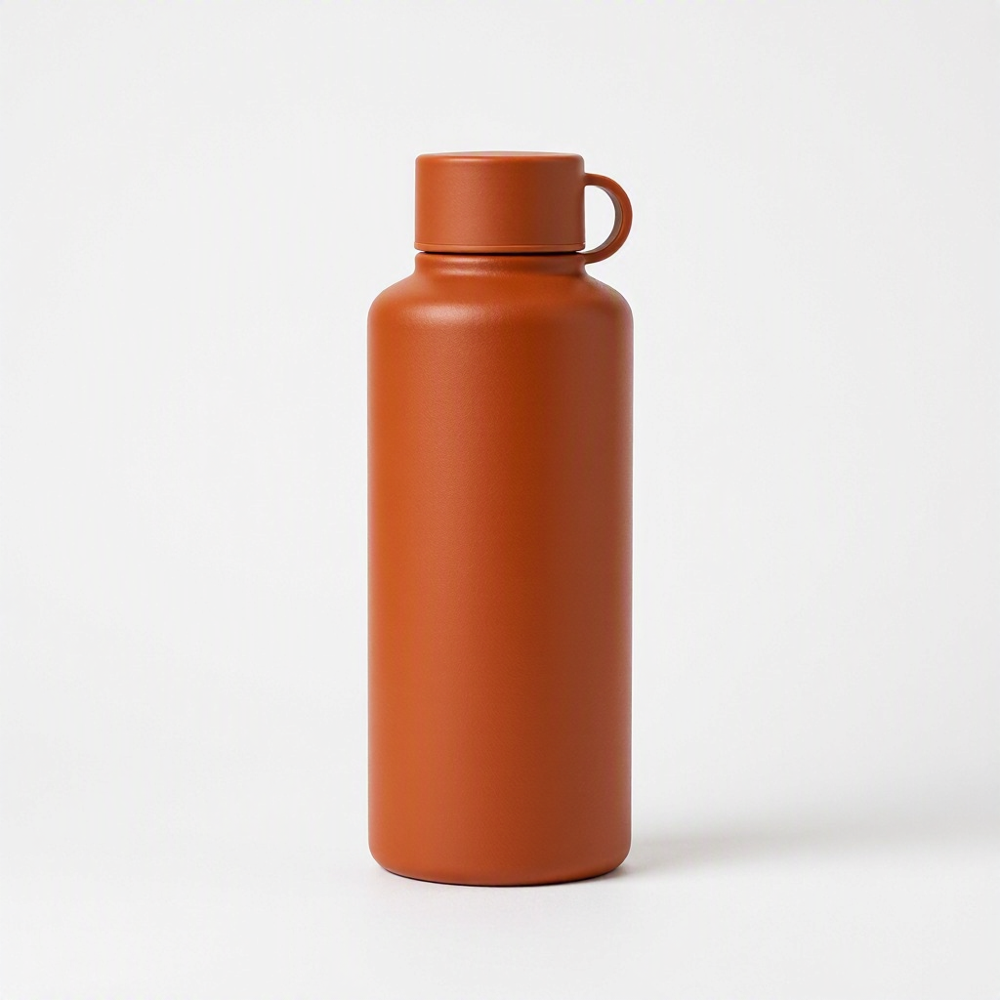


Concurrent batch (4 workers): 8 images in 22.6s (0.35 images/s)


In [7]:
MAX_WORKERS = 4   # increase after confirming your quota allows it

def _generate(args):
    idx, prompt = args
    t0 = time.monotonic()
    b64 = generate_image(prompt, width=1024, height=1024)
    elapsed = time.monotonic() - t0
    return idx, b64, elapsed

t_start = time.monotonic()

with concurrent.futures.ThreadPoolExecutor(max_workers=MAX_WORKERS) as executor:
    futures = list(executor.map(_generate, enumerate(PRODUCT_PROMPTS)))

total_elapsed = time.monotonic() - t_start

for idx, b64, per_latency in futures:
    show(b64, save_as=f"batch-par-{idx:02d}.png")

images_per_sec = len(PRODUCT_PROMPTS) / total_elapsed
print(f"\nConcurrent batch ({MAX_WORKERS} workers): "
      f"{len(PRODUCT_PROMPTS)} images in {total_elapsed:.1f}s "
      f"({images_per_sec:.2f} images/s)")


## 7. Your Turn to Explore

Try adjusting the parameters above to explore production trade-offs:

1. **Scaling `max_workers`** — double the worker count. Does throughput scale linearly,
   or does latency per worker increase as concurrency rises?
2. **Mixed aspect ratios** — replace the uniform 1024×1024 prompts with a mix of landscape
   and portrait sizes. Does throughput differ across aspect ratios?
3. **Cost-per-variant pipeline** — calculate the total cost for a catalogue of 500 products
   with 3 colour variants each. At what worker count does the job complete within 10 minutes?


In [ ]:
# Your experiments here


## 8. Summary

You used MAI-Image-2.5-Flash to:

- Process a sequential batch of 8 product-photography prompts and measure per-image latency
- Build a cost and time estimate for larger generation jobs
- Run the same batch concurrently with `ThreadPoolExecutor` and compare throughput

**Next steps**

- [MAI-Image-2.5 capsule](../../mai-image-2.5/2026-06-02/) — baseline model with image editing
- [MAI-Image-2.5-Pro capsule](../../mai-image-2.5-pro/2026-07-23/) — portrait quality and text rendering

**References**

- [Deploy and use MAI image models in Microsoft Foundry](https://learn.microsoft.com/en-us/azure/foundry/foundry-models/how-to/use-foundry-models-mai-image?tabs=python)
- [Build 2026 MAI keynote transcript](https://microsoft.ai/news/microsoft-build-2026-mai-keynote-transcript/)
- [MAI-Image-2.5 model page](https://microsoft.ai/models/mai-image-2-5/)
- [Image generation primer](../../../../docs/primers/image-generation.md)
